- This notebook is try to train FM with the Miscibility dataset

In [69]:
import pandas as pd
import numpy as np
from itertools import combinations
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns
import plotly.graph_objs as go
import plotly.io as pio
import umap


In [2]:
import sys
sys.path.append("../src/models")
sys.path.append("../src")
sys.path.append("../")

from models.smi_ted.smi_ted_light.load import load_smi_ted
import torch

In [40]:
from sklearn.model_selection import train_test_split
from utils import run_classifier_update

In [4]:
file_path ='../../data/Matrix/Chemical_name_smiles_update.csv'

In [5]:
df_chemical = pd.read_csv(file_path)
df_chemical.head()

,Chmical_Name,SMILES,Source
0,3-[(3-cholamidopropyl)dimethylammonio]-1- prop...,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,NaN
1,"4-(1,1,3,3-Tetramethylbutyl)phenyl-polyethylen...",CC(C)(C)CC(C)(C)C1=CC=C(C=C1)OCCO,NaN
2,Alginic Acid,[C@H]1([C@@H]([C@@H](OC([C@H]1O)C(=O)O)O[C@H]2...,NaN
3,Amylopectin,C([C@@H]1[C@H]([C@@H]([C@H]([C@H](O1)O[C@@H]2[...,NaN
4,Bovine Serum Albumin,NaN,NaN


In [6]:
df_chemical.shape

(68, 3)

In [7]:
file_path1='../../data/Matrix/pairs.csv'
df_pairs = pd.read_csv(file_path1, header=None)
df_pairs.head()

,0,1,2,3,4,5,6,7,8,9,...,58,59,60,61,62,63,64,65,66,67
0,1,1,1,1,1,1,1,1,1,1,...,1,0,0,1,0,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1,...,1,0,0,1,0,1,1,1,1,1
2,1,1,1,0,1,1,1,1,1,1,...,1,1,1,1,1,0,1,1,1,1
3,1,1,0,1,1,1,0,0,0,1,...,1,1,0,1,1,0,1,1,0,1
4,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [8]:
df_pairs.shape

(68, 68)

In [9]:
# Step 1: Identify indices where SMILES is not NaN
valid_indices = df_chemical[df_chemical['SMILES'].notna()].index

# Step 2: Filter df_chemical
df_chemical_cleaned = df_chemical.loc[valid_indices].reset_index(drop=True)

# Step 3: Filter df_pairs (both rows and columns)
df_pairs_cleaned = df_pairs.loc[valid_indices, valid_indices].reset_index(drop=True)
df_pairs_cleaned.columns = range(len(df_pairs_cleaned))  # reset column names to 0,1,2,...

print(df_chemical_cleaned.shape)
print(df_pairs_cleaned.shape)


(53, 3)
(53, 53)


In [10]:
valid_indices

Index([ 0,  1,  2,  3,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 18, 21, 22,
       23, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 41, 42, 43, 44,
       45, 46, 48, 49, 50, 51, 52, 54, 55, 57, 58, 59, 61, 62, 63, 64, 65],
      dtype='int64')

In [11]:
file_path2 = '../../data/Matrix/compounds.csv'
df_compouds = pd.read_csv(file_path2)
df_compouds.head()

,ID,NAME,CLASS,monomer_mw,XlogP3,h-bond_donors,h-bond_acceptors,complexity,concentration,polymer_mw
0,1,CHAPS,Surfactant,614.9,2.9,4.0,7.0,1030.0,20.0,614.0
1,2,Triton X-100,Surfactant,527.7,-2.0,1190.0,1704.0,731.0,25.0,80000.0
2,3,Alg,Polymer,448.5,-3.6,2676.0,4348.0,511.0,4.0,150000.0
3,4,AP,Polymer,828.7,-10.6,6516.0,12690.0,1210.0,10.0,213700.0
4,5,BSA,Protein,331.8,-2.3,1190.0,1704.0,391.0,40.0,66000.0


In [12]:
df_compouds_cleaned = df_compouds.loc[valid_indices].reset_index(drop=True)

In [13]:
df_chem_com = pd.concat([df_chemical_cleaned.iloc[:,0:2], df_compouds_cleaned.iloc[:,:]], axis=1)
df_chem_com.head()

,Chmical_Name,SMILES,ID,NAME,CLASS,monomer_mw,XlogP3,h-bond_donors,h-bond_acceptors,complexity,concentration,polymer_mw
0,3-[(3-cholamidopropyl)dimethylammonio]-1- prop...,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,1,CHAPS,Surfactant,614.9,2.9,4.0,7.0,1030.0,20.0,614.0
1,"4-(1,1,3,3-Tetramethylbutyl)phenyl-polyethylen...",CC(C)(C)CC(C)(C)C1=CC=C(C=C1)OCCO,2,Triton X-100,Surfactant,527.7,-2.0,1190.0,1704.0,731.0,25.0,80000.0
2,Alginic Acid,[C@H]1([C@@H]([C@@H](OC([C@H]1O)C(=O)O)O[C@H]2...,3,Alg,Polymer,448.5,-3.6,2676.0,4348.0,511.0,4.0,150000.0
3,Amylopectin,C([C@@H]1[C@H]([C@@H]([C@H]([C@H](O1)O[C@@H]2[...,4,AP,Polymer,828.7,-10.6,6516.0,12690.0,1210.0,10.0,213700.0
4,Carageenan (Iota),C1[C@@H]2[C@@H]([C@H](O1)[C@H]([C@H](O2)O)OS(=...,6,Iota-Car,Polymer,625.7,-5.0,7089.0,16497.0,998.0,1.0,671875.0


In [14]:
df_chem_com.to_csv('df_chem_com_20250501_1.csv', index=False)

In [15]:
df_chem_com.shape

(53, 12)

In [16]:
def calculate_mM(concentration_percent, monomer_mw):
    """
    concentration_percent: % w/w (grams solute per 100 g solution)
    monomer_mw: g/mol (monomer molecular weight)

    returns: concentration in mM in final 20 µL solution (after adding 10 µL molecule solution to 10 µL other solution)
    """
    
    if pd.isna(concentration_percent) or pd.isna(monomer_mw) or monomer_mw == 0:
        return np.nan

    # grams of solute in 10 µL
    grams_per_100ml = concentration_percent / 100  # g/mL
    volume_added_ml = 10 / 1000  # 10 µL → mL
    grams_solute = grams_per_100ml * volume_added_ml

    # moles of solute
    moles_solute = grams_solute / monomer_mw

    # calculate molarity in final 20 µL (0.00002 L)
    total_volume_L = 20 / 1_000_000  # 20 µL → L
    molarity_M = moles_solute / total_volume_L

    # convert to mM
    molarity_mM = molarity_M * 1000

    return molarity_mM

In [17]:
df_chem_com['concentration_mM'] = df_chem_com.apply(
    lambda row: calculate_mM(row['concentration'], row['monomer_mw']), axis=1
)

df_chem_com

,Chmical_Name,SMILES,ID,NAME,CLASS,monomer_mw,XlogP3,h-bond_donors,h-bond_acceptors,complexity,concentration,polymer_mw,concentration_mM
0,3-[(3-cholamidopropyl)dimethylammonio]-1- prop...,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,1,CHAPS,Surfactant,614.9,2.9,4.0,7.0,1030.0,20.0,614.0,162.628070
1,"4-(1,1,3,3-Tetramethylbutyl)phenyl-polyethylen...",CC(C)(C)CC(C)(C)C1=CC=C(C=C1)OCCO,2,Triton X-100,Surfactant,527.7,-2.0,1190.0,1704.0,731.0,25.0,80000.0,236.877013
2,Alginic Acid,[C@H]1([C@@H]([C@@H](OC([C@H]1O)C(=O)O)O[C@H]2...,3,Alg,Polymer,448.5,-3.6,2676.0,4348.0,511.0,4.0,150000.0,44.593088
3,Amylopectin,C([C@@H]1[C@H]([C@@H]([C@H]([C@H](O1)O[C@@H]2[...,4,AP,Polymer,828.7,-10.6,6516.0,12690.0,1210.0,10.0,213700.0,60.335465
4,Carageenan (Iota),C1[C@@H]2[C@@H]([C@H](O1)[C@H]([C@H](O2)O)OS(=...,6,Iota-Car,Polymer,625.7,-5.0,7089.0,16497.0,998.0,1.0,671875.0,7.991050
5,Carageenan (Kappa),C1[C@@H]2[C@@H]([C@H](O1)[C@H]([C@H](O2)O)O)O[...,7,Kappa-Car,Polymer,788.7,-8.5,2434.0,7607.0,1380.0,1.0,240000.0,6.339546
6,Carageenan (Lambda),C(C1C(C(C(C(O1)OC2C(OC(C(C2O)OS(=O)(=O)[O-])O)...,8,Lambda-Car,Polymer,594.5,-3.9,7246.0,22947.0,1030.0,2.0,718000.0,16.820858
7,Carboxymethyl Cellulose,CC(=O)O.C(C(C(C(C(C=O)O)O)O)O)O,9,CMC,Polymer,240.2,-2.0,2248.0,2998.0,169.0,5.0,90000.0,104.079933
8,Carboxymethyl Dextran,C(C1C(C(C(C(O1)OCC2C(C(C(C(O2)OCC(C(C(C(C=O)OC...,10,CM-Dex,Polymer,731.1,-5.0,3473.0,5784.0,1184.0,20.0,250000.0,136.780194
9,Casein,CC(C)CC(C(=NC(CCC(=N)O)C(=NC(CC(=O)O)C(=NC(CCC...,11,Cas,Protein,2062.0,-0.8,362.0,516.0,4830.0,10.0,22000.0,24.248303


In [18]:
df_chem_com.shape

(53, 13)

In [19]:
df_pairs_cleaned.shape

(53, 53)

In [20]:
def is_symmetric(matrix):
    """
    Checks if a square matrix is symmetric.

    Args:
        matrix (list of lists or numpy.ndarray): The matrix to check.

    Returns:
        bool: True if the matrix is symmetric, False otherwise.
    """
    # Ensure it's a NumPy array for easier manipulation
    matrix = np.array(matrix)

    # Check if the matrix is square
    if matrix.shape[0] != matrix.shape[1]:
        return False  # A non-square matrix cannot be symmetric

    # Check for symmetry: compare the matrix to its transpose
    return np.allclose(matrix, matrix.T) # Use np.allclose for floating-point comparisons


# Example usage with your provided data (as a string, then converted to a list of lists)
matrix_data = df_pairs_cleaned

# Check if the matrix is symmetric
if is_symmetric(matrix_data):
    print("The matrix is symmetric.")
else:
    print("The matrix is not symmetric.")

The matrix is symmetric.


In [21]:
# Get mixture formulation
# --- Step 1: Create mapping from index to SMILES and concentration_mM ---
smiles_map = df_chem_com['SMILES'].to_dict()  # index → SMILES
conc_map = df_chem_com['concentration_mM'].to_dict()  # index → concentration_mM

# --- Step 2: Generate all unique binary pairs (i < j) ---
pairs = list(combinations(range(len(df_chem_com)), 2))  # (i,j) where i < j

# --- Step 3: Construct rows ---
rows = []
for i, j in pairs:
    smi1 = smiles_map[i]
    conc1 = conc_map[i]
    smi2 = smiles_map[j]
    conc2 = conc_map[j]
    miscibility = df_pairs_cleaned.iloc[i, j]  # value in df_pairs_cleaned

    row = {
        'smi1': smi1,
        'conc1': conc1,
        'smi2': smi2,
        'conc2': conc2,
        'miscibility': miscibility
    }
    rows.append(row)

# --- Step 4: Create DataFrame ---
df_mixture = pd.DataFrame(rows)

# Optional: sort columns just in case
df_mixture = df_mixture[['smi1', 'conc1', 'smi2', 'conc2', 'miscibility']]

In [22]:
df_mixture.shape # 53 * (53 - 1) / 2 

(1378, 5)

In [24]:
df_mixture.head()

,smi1,conc1,smi2,conc2,miscibility
0,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,CC(C)(C)CC(C)(C)C1=CC=C(C=C1)OCCO,236.877013,1
1,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,[C@H]1([C@@H]([C@@H](OC([C@H]1O)C(=O)O)O[C@H]2...,44.593088,1
2,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,C([C@@H]1[C@H]([C@@H]([C@H]([C@H](O1)O[C@@H]2[...,60.335465,1
3,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,C1[C@@H]2[C@@H]([C@H](O1)[C@H]([C@H](O2)O)OS(=...,7.991050,1
4,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,C1[C@@H]2[C@@H]([C@H](O1)[C@H]([C@H](O2)O)O)O[...,6.339546,1


In [112]:
df_mixture.to_csv('df_mixture_20250502.csv', index=False)

In [45]:
# Now we can start train model with FM representation

In [25]:
def normalize_concentrations(df, conc_cols):
    conc_sum = df[conc_cols].sum(axis=1)
    for conc in conc_cols:
        df[conc] = df[conc] / conc_sum
    return df

In [26]:
def get_latent_space(df):
    train_df = df.copy()

    train_smiles_list = pd.concat([train_df[f'smi{i}'] for i in range(1, 3)]).unique().tolist()
    
    model_SMI = load_smi_ted(folder='../models/smi_ted/smi_ted_light', ckpt_filename='smi-ted-Light_40.pt')
    
    return_tensor=True
    with torch.no_grad():
        x_emb = model_SMI.encode(train_smiles_list, return_torch=return_tensor)
    
    x_emb_array  = x_emb.numpy()
    x_emb_frame = pd.DataFrame(x_emb_array)

    train_emb = [np.nan if row.isna().all() else row.dropna().tolist() for _, row in x_emb_frame.iterrows()]
    
    train_dict = dict(zip(train_smiles_list, train_emb))
    
    def replace_with_list(value, my_dict):
        return my_dict.get(value, value)
    
    # Replace the smiles string with its embeddings
    df_train_emb = train_df.applymap(lambda x: replace_with_list(x, train_dict))
    
    # Drop rows with NaN and reset index
    df_train_emb = df_train_emb.dropna().reset_index(drop=True)
    
    # Normalize concentrations
    conc_cols = [f'conc{i}' for i in range(1, 3)]
    df_train_emb = normalize_concentrations(df_train_emb, conc_cols)
    
    # Construct feature vector by scaling the representation by their corresponding composition and add
    def build_feature_vector(df, smi_cols, conc_cols):
        components = [df[smi].apply(pd.Series).mul(df[conc], axis=0) for smi, conc in zip(smi_cols, conc_cols)]
        return sum(components)
    
    # List of columns to process
    smi_cols = [f'smi{i}' for i in range(1, 3)]
    conc_cols = [f'conc{i}' for i in range(1, 3)]
    
    x_smi = build_feature_vector(df_train_emb, smi_cols, conc_cols)

    return df_train_emb, x_smi

In [27]:
df_train_emb, x_smi = get_latent_space(df_mixture)

Random Seed: 12345
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding


/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)


Vocab size: 2393
[INFERENCE MODE - smi-ted-Light]


100%|██████████| 53/53 [00:01<00:00, 39.57it/s]
/var/folders/wn/w203521n4h18b4_rz5rd9tw80000gp/T/ipykernel_81489/87061925.py:23: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_train_emb = train_df.applymap(lambda x: replace_with_list(x, train_dict))


In [34]:
x_smi

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.396622,-0.485244,0.073829,0.363909,0.468765,-0.707002,1.107883,0.048230,0.851008,0.102786,...,-1.295732,-0.016802,0.210699,0.292674,-0.604047,0.554287,-0.783447,0.751108,0.594072,-0.080489
1,0.426807,-0.511176,0.063942,0.362977,0.399048,-0.775012,1.071118,0.036969,0.956024,0.114717,...,-1.336209,-0.003823,0.298028,0.281305,-0.605786,0.588821,-0.834901,0.680230,0.599377,-0.122557
2,0.435105,-0.495445,0.050651,0.362118,0.428933,-0.743644,1.080636,0.026108,0.948122,0.095583,...,-1.328855,-0.019030,0.320801,0.283548,-0.590604,0.586896,-0.857433,0.662571,0.570647,-0.103189
3,0.431270,-0.506898,0.064336,0.349437,0.377875,-0.781025,1.074736,0.027446,0.971289,0.140413,...,-1.320555,0.003030,0.317536,0.269966,-0.617953,0.582582,-0.868878,0.668550,0.587808,-0.084291
4,0.433459,-0.509713,0.064572,0.350700,0.375404,-0.779854,1.074978,0.027310,0.969275,0.141410,...,-1.322345,0.003166,0.317095,0.268148,-0.617761,0.585752,-0.871287,0.669175,0.590898,-0.083505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1373,0.353657,-0.414267,0.102327,0.445108,0.459639,-0.682479,1.091200,0.081897,0.914820,0.132219,...,-1.314747,-0.202788,0.253820,0.336689,-0.553314,0.484660,-0.539699,0.854958,0.579914,-0.128316
1374,0.385577,-0.472448,0.072665,0.489218,0.396895,-0.637906,1.023206,-0.000365,0.920996,0.091516,...,-1.317363,-0.166163,0.191220,0.277527,-0.640049,0.386586,-0.553646,0.893802,0.625702,-0.299325
1375,0.338395,-0.401601,0.113714,0.414367,0.412641,-0.735064,1.148112,0.070444,0.919846,0.147542,...,-1.250000,-0.137573,0.300471,0.362525,-0.544607,0.522617,-0.642987,0.819608,0.572416,-0.011639
1376,0.374499,-0.468112,0.080034,0.463810,0.338095,-0.686102,1.072339,-0.024961,0.927203,0.101311,...,-1.250008,-0.092301,0.230443,0.295496,-0.644234,0.411274,-0.663872,0.862763,0.624875,-0.203440


In [29]:
df_train_emb

,smi1,conc1,smi2,conc2,miscibility
0,"[0.43436676263809204, -0.5092658400535583, 0.0...",0.407074,"[0.37070798873901367, -0.46875208616256714, 0....",0.592926,1
1,"[0.43436676263809204, -0.5092658400535583, 0.0...",0.784804,"[0.39923763275146484, -0.5181440114974976, 0.0...",0.215196,1
2,"[0.43436676263809204, -0.5092658400535583, 0.0...",0.729393,"[0.43709638714790344, -0.45819392800331116, 0....",0.270607,1
3,"[0.43436676263809204, -0.5092658400535583, 0.0...",0.953164,"[0.36824312806129456, -0.45870381593704224, 0....",0.046836,1
4,"[0.43436676263809204, -0.5092658400535583, 0.0...",0.962481,"[0.4101769030094147, -0.5211842656135559, 0.12...",0.037519,1
...,...,...,...,...,...
1373,"[0.4185637831687927, -0.4767872989177704, 0.08...",0.453572,"[0.2997805178165436, -0.3623706102371216, 0.11...",0.546428,1
1374,"[0.4185637831687927, -0.4767872989177704, 0.08...",0.471851,"[0.3561071455478668, -0.4685714840888977, 0.06...",0.528149,1
1375,"[0.40315836668014526, -0.467397004365921, 0.10...",0.373527,"[0.2997805178165436, -0.3623706102371216, 0.11...",0.626473,1
1376,"[0.40315836668014526, -0.467397004365921, 0.10...",0.390888,"[0.3561071455478668, -0.4685714840888977, 0.06...",0.609112,0


In [31]:
# Do some checking for the order
def test_normalization(x1, x2):
    sum_ =x1+x2
    print(x1/sum_)
    print(x2/sum_)
    return 

In [33]:
test_normalization(df_mixture['conc1'][1], df_mixture['conc2'][1])

0.7848043676069154
0.21519563239308465


In [30]:
df_mixture.head()

,smi1,conc1,smi2,conc2,miscibility
0,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,CC(C)(C)CC(C)(C)C1=CC=C(C=C1)OCCO,236.877013,1
1,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,[C@H]1([C@@H]([C@@H](OC([C@H]1O)C(=O)O)O[C@H]2...,44.593088,1
2,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,C([C@@H]1[C@H]([C@@H]([C@H]([C@H](O1)O[C@@H]2[...,60.335465,1
3,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,C1[C@@H]2[C@@H]([C@H](O1)[C@H]([C@H](O2)O)OS(=...,7.991050,1
4,C[C@H](CCC(=O)NCCC[N+](C)(C)CCCS(=O)(=O)[O-])[...,162.62807,C1[C@@H]2[C@@H]([C@H](O1)[C@H]([C@H](O2)O)O)O[...,6.339546,1


In [35]:
df_total = pd.concat([x_smi, df_train_emb['miscibility']],axis=1)
df_total

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,miscibility
0,0.396622,-0.485244,0.073829,0.363909,0.468765,-0.707002,1.107883,0.048230,0.851008,0.102786,...,-0.016802,0.210699,0.292674,-0.604047,0.554287,-0.783447,0.751108,0.594072,-0.080489,1
1,0.426807,-0.511176,0.063942,0.362977,0.399048,-0.775012,1.071118,0.036969,0.956024,0.114717,...,-0.003823,0.298028,0.281305,-0.605786,0.588821,-0.834901,0.680230,0.599377,-0.122557,1
2,0.435105,-0.495445,0.050651,0.362118,0.428933,-0.743644,1.080636,0.026108,0.948122,0.095583,...,-0.019030,0.320801,0.283548,-0.590604,0.586896,-0.857433,0.662571,0.570647,-0.103189,1
3,0.431270,-0.506898,0.064336,0.349437,0.377875,-0.781025,1.074736,0.027446,0.971289,0.140413,...,0.003030,0.317536,0.269966,-0.617953,0.582582,-0.868878,0.668550,0.587808,-0.084291,1
4,0.433459,-0.509713,0.064572,0.350700,0.375404,-0.779854,1.074978,0.027310,0.969275,0.141410,...,0.003166,0.317095,0.268148,-0.617761,0.585752,-0.871287,0.669175,0.590898,-0.083505,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1373,0.353657,-0.414267,0.102327,0.445108,0.459639,-0.682479,1.091200,0.081897,0.914820,0.132219,...,-0.202788,0.253820,0.336689,-0.553314,0.484660,-0.539699,0.854958,0.579914,-0.128316,1
1374,0.385577,-0.472448,0.072665,0.489218,0.396895,-0.637906,1.023206,-0.000365,0.920996,0.091516,...,-0.166163,0.191220,0.277527,-0.640049,0.386586,-0.553646,0.893802,0.625702,-0.299325,1
1375,0.338395,-0.401601,0.113714,0.414367,0.412641,-0.735064,1.148112,0.070444,0.919846,0.147542,...,-0.137573,0.300471,0.362525,-0.544607,0.522617,-0.642987,0.819608,0.572416,-0.011639,1
1376,0.374499,-0.468112,0.080034,0.463810,0.338095,-0.686102,1.072339,-0.024961,0.927203,0.101311,...,-0.092301,0.230443,0.295496,-0.644234,0.411274,-0.663872,0.862763,0.624875,-0.203440,0


In [54]:
df_total.to_csv('df_total_20250501.csv', index=False)

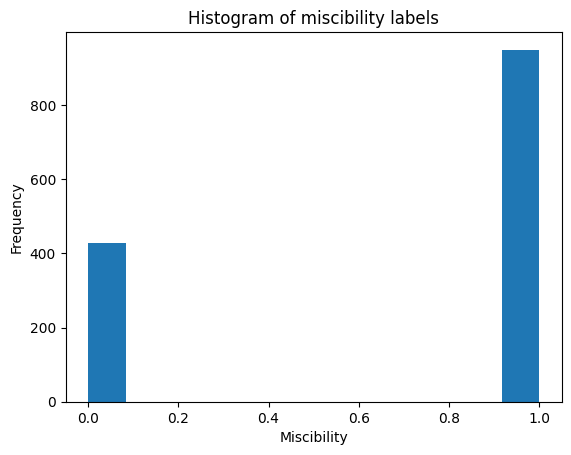

In [55]:
# Data distribution
plt.hist(df_total['miscibility'], bins='auto')  # 'auto' chooses the number of bins automatically

# Add labels and title
plt.xlabel('Miscibility')
plt.ylabel('Frequency')
plt.title('Histogram of miscibility labels')

# Show the plot
plt.show()

In [38]:
data = df_total.copy()
train_df, test_df = train_test_split(
        data,
        test_size=0.2,  
        random_state=42  # for reproducibility
    )

train_x = train_df.iloc[:,0:768]
train_y = train_df['miscibility']

test_x = test_df.iloc[:,0:768]
test_y = test_df['miscibility']

In [41]:
clf, y_pred, roc_auc, fpr, tpr, threshold = run_classifier_update(train_x, train_y, test_x, test_y, classifier_alter=False)

ROC-AUC Score: 0.8263


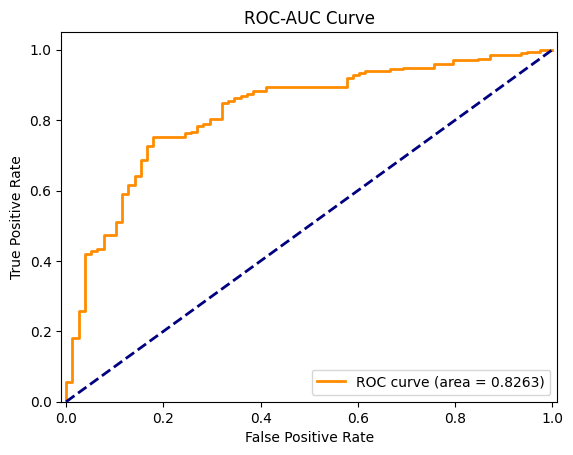

In [45]:
fig, ax = plt.subplots()
ax.set_title("ROC-AUC Curve")
ax.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax.set_xlim([-0.01, 1.01])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
# ax.set_title(f'ROC ({feature}_removed)')
ax.legend(loc='lower right')

In [121]:
# Using Random forest classifier
clf, y_pred, roc_auc, fpr, tpr, threshold = run_classifier_update(train_x, train_y, test_x, test_y, classifier_alter=True)

ROC-AUC Score: 0.7793


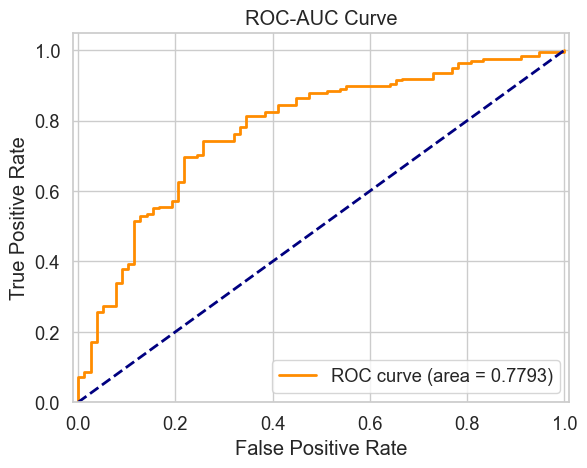

In [122]:
fig, ax = plt.subplots()
ax.set_title("ROC-AUC Curve")
ax.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax.set_xlim([-0.01, 1.01])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
# ax.set_title(f'ROC ({feature}_removed)')
ax.legend(loc='lower right')

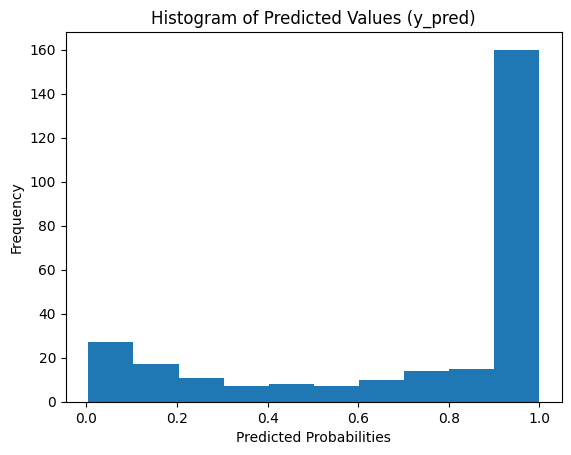

In [46]:
plt.hist(y_pred, bins='auto')  # 'auto' chooses the number of bins automatically

# Add labels and title
plt.xlabel('Predicted Probabilities')
plt.ylabel('Frequency')
plt.title('Histogram of Predicted Values (y_pred)')

# Show the plot
plt.show()

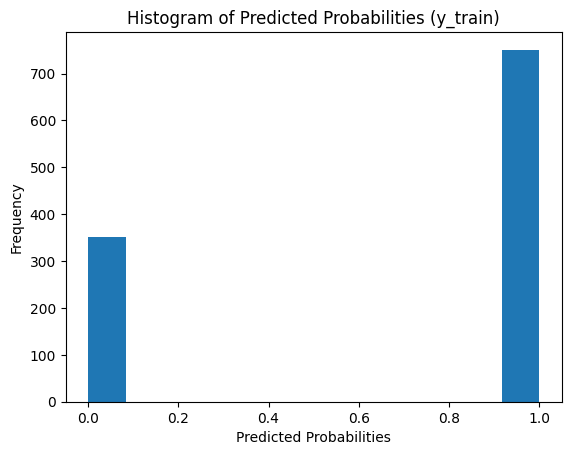

In [49]:
plt.hist(train_y, bins='auto')  # 'auto' chooses the number of bins automatically

# Add labels and title
plt.xlabel('Predicted Probabilities')
plt.ylabel('Frequency')
plt.title('Histogram of Predicted Probabilities (y_train)')

# Show the plot
plt.show()

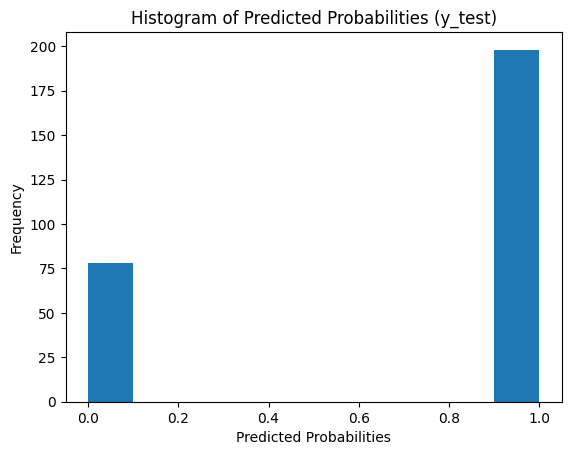

In [50]:
plt.hist(test_y, bins='auto')  # 'auto' chooses the number of bins automatically

# Add labels and title
plt.xlabel('Predicted Probabilities')
plt.ylabel('Frequency')
plt.title('Histogram of Predicted Probabilities (y_test)')

# Show the plot
plt.show()

In [52]:
threshold

array([       inf, 0.9997583 , 0.9990646 , 0.9988925 , 0.99639195,
       0.9963856 , 0.99442357, 0.99434054, 0.9869049 , 0.9864444 ,
       0.98628354, 0.9849332 , 0.9849244 , 0.9841405 , 0.9805117 ,
       0.9793956 , 0.9755645 , 0.97535056, 0.9597845 , 0.95803726,
       0.95332795, 0.95317024, 0.94343   , 0.9421295 , 0.93270147,
       0.93107945, 0.91531897, 0.9129485 , 0.8881058 , 0.85784614,
       0.83783346, 0.8330559 , 0.8230471 , 0.81830716, 0.7945198 ,
       0.7777904 , 0.77673435, 0.7741337 , 0.74026185, 0.7340016 ,
       0.6815776 , 0.660911  , 0.65952253, 0.65449196, 0.62017447,
       0.6074123 , 0.5811295 , 0.5790398 , 0.5748806 , 0.5482304 ,
       0.5327095 , 0.4877565 , 0.47191817, 0.28422746, 0.24587299,
       0.23957475, 0.22908297, 0.2283671 , 0.20871554, 0.18633494,
       0.18412171, 0.17615026, 0.16698353, 0.14071631, 0.13427553,
       0.11612176, 0.11048643, 0.06554903, 0.06109538, 0.04515979,
       0.04511493, 0.03924299, 0.03007609, 0.02577961, 0.02400

In [53]:
# Latent space distribution

In [56]:
df_total

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,miscibility
0,0.396622,-0.485244,0.073829,0.363909,0.468765,-0.707002,1.107883,0.048230,0.851008,0.102786,...,-0.016802,0.210699,0.292674,-0.604047,0.554287,-0.783447,0.751108,0.594072,-0.080489,1
1,0.426807,-0.511176,0.063942,0.362977,0.399048,-0.775012,1.071118,0.036969,0.956024,0.114717,...,-0.003823,0.298028,0.281305,-0.605786,0.588821,-0.834901,0.680230,0.599377,-0.122557,1
2,0.435105,-0.495445,0.050651,0.362118,0.428933,-0.743644,1.080636,0.026108,0.948122,0.095583,...,-0.019030,0.320801,0.283548,-0.590604,0.586896,-0.857433,0.662571,0.570647,-0.103189,1
3,0.431270,-0.506898,0.064336,0.349437,0.377875,-0.781025,1.074736,0.027446,0.971289,0.140413,...,0.003030,0.317536,0.269966,-0.617953,0.582582,-0.868878,0.668550,0.587808,-0.084291,1
4,0.433459,-0.509713,0.064572,0.350700,0.375404,-0.779854,1.074978,0.027310,0.969275,0.141410,...,0.003166,0.317095,0.268148,-0.617761,0.585752,-0.871287,0.669175,0.590898,-0.083505,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1373,0.353657,-0.414267,0.102327,0.445108,0.459639,-0.682479,1.091200,0.081897,0.914820,0.132219,...,-0.202788,0.253820,0.336689,-0.553314,0.484660,-0.539699,0.854958,0.579914,-0.128316,1
1374,0.385577,-0.472448,0.072665,0.489218,0.396895,-0.637906,1.023206,-0.000365,0.920996,0.091516,...,-0.166163,0.191220,0.277527,-0.640049,0.386586,-0.553646,0.893802,0.625702,-0.299325,1
1375,0.338395,-0.401601,0.113714,0.414367,0.412641,-0.735064,1.148112,0.070444,0.919846,0.147542,...,-0.137573,0.300471,0.362525,-0.544607,0.522617,-0.642987,0.819608,0.572416,-0.011639,1
1376,0.374499,-0.468112,0.080034,0.463810,0.338095,-0.686102,1.072339,-0.024961,0.927203,0.101311,...,-0.092301,0.230443,0.295496,-0.644234,0.411274,-0.663872,0.862763,0.624875,-0.203440,0


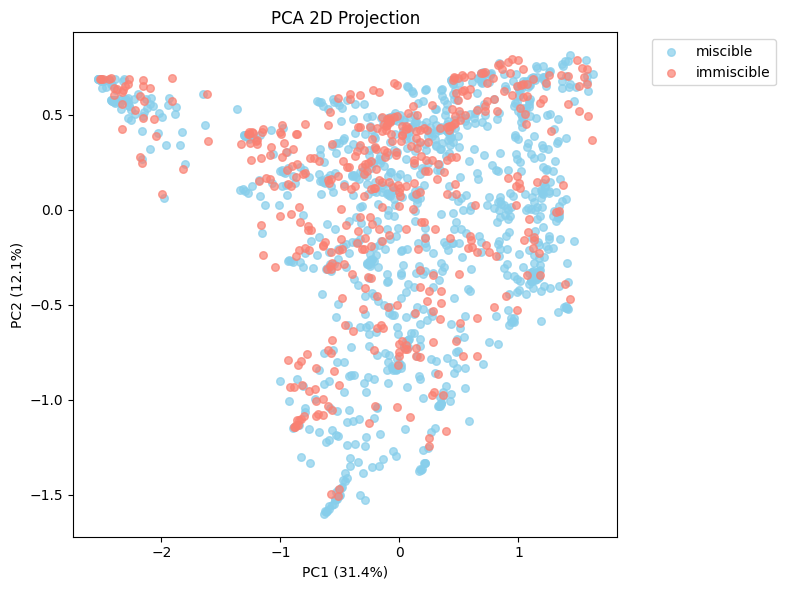

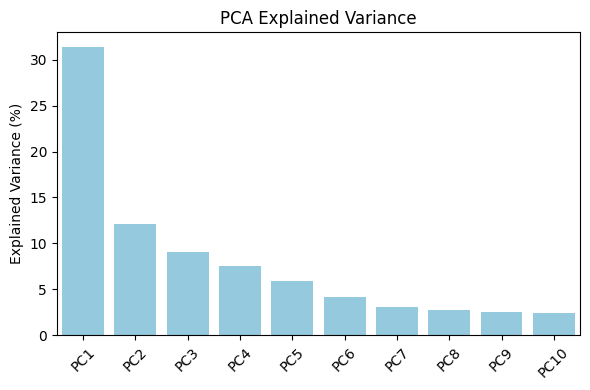

In [65]:
X = df_total.iloc[:, :768].values
y = df_total['miscibility'].values

# 2. PCA
pca = PCA(n_components=10)  # Keep more components initially
X_pca = pca.fit_transform(X)

explained_variance = pca.explained_variance_ratio_

# 3. Color mapping for two miscibility types
miscibility_types = df_total['miscibility'].unique()
if len(miscibility_types) != 2:
    print(f"Warning: Found {len(miscibility_types)} unique miscibility types. Ensure there are exactly two for the color mapping.")

colors = ['skyblue', 'salmon']  # Define your two colors
color_dict = dict(zip(miscibility_types, colors))
legends = ['miscible', 'immiscible']
# 4. 2D Scatter Plot
plt.figure(figsize=(8, 6))
for i, surfactant in enumerate(miscibility_types):
    idx = (y == surfactant)
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1],
                color=color_dict[surfactant],
                label=legends[i], alpha=0.7, s=30)

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}%)")
plt.title('PCA 2D Projection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 5. 3D Interactive Scatter Plot
traces = []
for surfactant in miscibility_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_pca[idx, 0],
        y=X_pca[idx, 1],
        z=X_pca[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=color_dict[surfactant],
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=str(surfactant)
    )
    traces.append(trace)

layout = go.Layout(
    title='PCA 3D Projection',
    scene=dict(
        xaxis_title=f'PC1 ({explained_variance[0]*100:.1f}%)',
        yaxis_title=f'PC2 ({explained_variance[1]*100:.1f}%)',
        zaxis_title=f'PC3 ({explained_variance[2]*100:.1f}%)'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    legend=dict(title='Miscible or not (1 for miscible, 0 for immisible')
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)

# 6. Explained Variance Plot (remains the same as it shows overall variance)
plt.figure(figsize=(6, 4))
sns.barplot(x=[f'PC{i+1}' for i in range(10)], y=explained_variance*100, color='skyblue')
plt.ylabel('Explained Variance (%)')
plt.title('PCA Explained Variance')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [63]:
miscibility_types

array([1, 0])

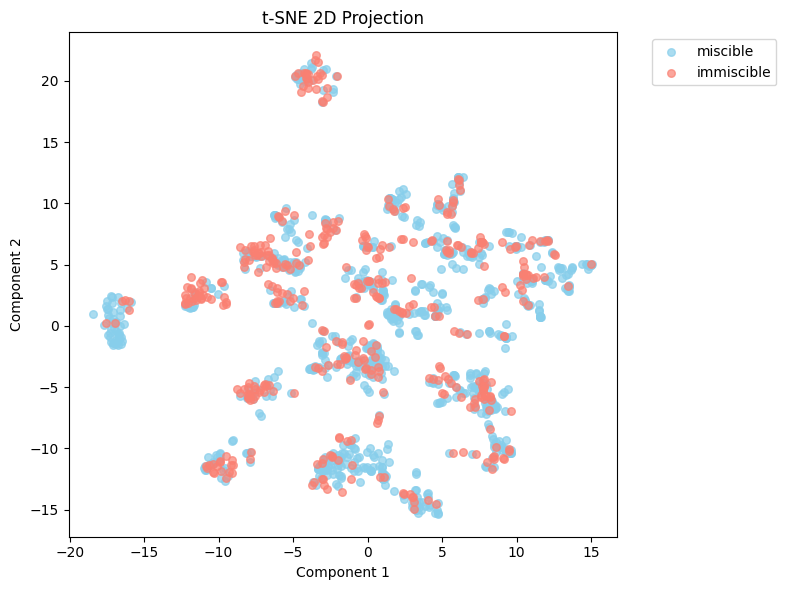

In [68]:
X = df_total.iloc[:, :768].values
y = df_total['miscibility'].values

# 2. PCA
reducer = TSNE(n_components=3, random_state=42)  
X_reduced = reducer.fit_transform(X)

# explained_variance = pca.explained_variance_ratio_

# 3. Color mapping for two miscibility types
miscibility_types = df_total['miscibility'].unique()
if len(miscibility_types) != 2:
    print(f"Warning: Found {len(miscibility_types)} unique miscibility types. Ensure there are exactly two for the color mapping.")

colors = ['skyblue', 'salmon']  # Define your two colors
color_dict = dict(zip(miscibility_types, colors))
legends = ['miscible', 'immiscible']
# 4. 2D Scatter Plot
plt.figure(figsize=(8, 6))
for i, surfactant in enumerate(miscibility_types):
    idx = (y == surfactant)
    plt.scatter(X_reduced[idx, 0], X_reduced[idx, 1],
                color=color_dict[surfactant],
                label=legends[i], alpha=0.7, s=30)

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('t-SNE 2D Projection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 5. 3D Interactive Scatter Plot
traces = []
for surfactant in miscibility_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_reduced[idx, 0],
        y=X_reduced[idx, 1],
        z=X_reduced[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=color_dict[surfactant],
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=str(surfactant)
    )
    traces.append(trace)

layout = go.Layout(
    title='t-SNE 3D Projection',
    scene=dict(
        xaxis_title='Component 1',
        yaxis_title='Component 2',
        zaxis_title='Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    legend=dict(title='Miscible or not (1 for miscible, 0 for immisible')
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)


In [ ]:
# Uniform Manifold Approximation and Projection

/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


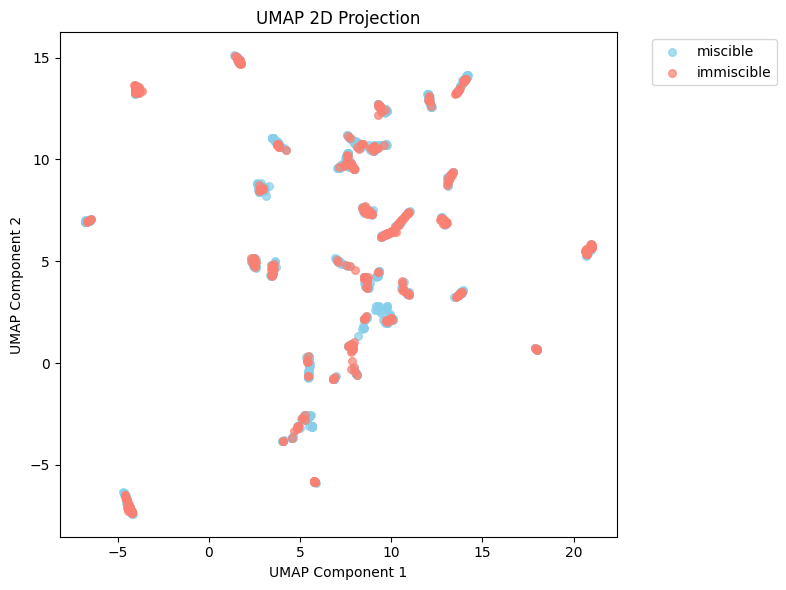

In [70]:
X = df_total.iloc[:, :768].values
y = df_total['miscibility'].values

# 2. UMAP
reducer = umap.UMAP(n_components=3, random_state=42)
X_reduced = reducer.fit_transform(X)

# 3. Color mapping for two miscibility types
miscibility_types = df_total['miscibility'].unique()
if len(miscibility_types) != 2:
    print(f"Warning: Found {len(miscibility_types)} unique miscibility types. Ensure there are exactly two for the color mapping.")

colors = ['skyblue', 'salmon']  # Define your two colors
color_dict = dict(zip(miscibility_types, colors))
legends = ['miscible', 'immiscible'] # Assuming your 'miscibility' column has two categories

# 4. 2D Scatter Plot
plt.figure(figsize=(8, 6))
for i, surfactant in enumerate(miscibility_types):
    idx = (y == surfactant)
    plt.scatter(X_reduced[idx, 0], X_reduced[idx, 1],
                color=color_dict[surfactant],
                label=legends[i], alpha=0.7, s=30)

plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP 2D Projection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 5. 3D Interactive Scatter Plot
traces = []
for surfactant in miscibility_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_reduced[idx, 0],
        y=X_reduced[idx, 1],
        z=X_reduced[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=color_dict[surfactant],
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=str(surfactant)
    )
    traces.append(trace)

layout = go.Layout(
    title='UMAP 3D Projection',
    scene=dict(
        xaxis_title='UMAP Component 1',
        yaxis_title='UMAP Component 2',
        zaxis_title='UMAP Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    legend=dict(title='Miscible or not (1 for miscible, 0 for immiscible')
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)

# Note: UMAP doesn't have an inherent 'explained variance' like PCA,
# so we're skipping that plot.

/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



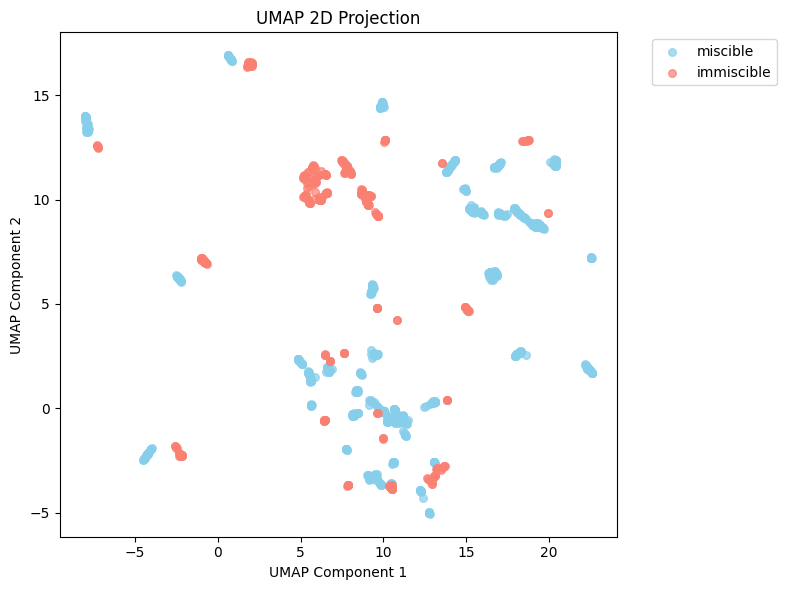

In [71]:
X = df_total.iloc[:, :768].values
y = df_total['miscibility'].values

# 2. UMAP with labels
reducer = umap.UMAP(n_components=3, target_metric='categorical', random_state=42)
X_reduced = reducer.fit_transform(X, y)  # Pass y here

# 3. Color mapping for two miscibility types
miscibility_types = df_total['miscibility'].unique()
if len(miscibility_types) != 2:
    print(f"Warning: Found {len(miscibility_types)} unique miscibility types. Ensure there are exactly two for the color mapping.")

colors = ['skyblue', 'salmon']  # Define your two colors
color_dict = dict(zip(miscibility_types, colors))
legends = ['miscible', 'immiscible'] # Assuming your 'miscibility' column has two categories

# 4. 2D Scatter Plot
plt.figure(figsize=(8, 6))
for i, surfactant in enumerate(miscibility_types):
    idx = (y == surfactant)
    plt.scatter(X_reduced[idx, 0], X_reduced[idx, 1],
                color=color_dict[surfactant],
                label=legends[i], alpha=0.7, s=30)

plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP 2D Projection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 5. 3D Interactive Scatter Plot
traces = []
for surfactant in miscibility_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_reduced[idx, 0],
        y=X_reduced[idx, 1],
        z=X_reduced[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=color_dict[surfactant],
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=str(surfactant)
    )
    traces.append(trace)

layout = go.Layout(
    title='UMAP 3D Projection',
    scene=dict(
        xaxis_title='UMAP Component 1',
        yaxis_title='UMAP Component 2',
        zaxis_title='UMAP Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    legend=dict(title='Miscible or not (1 for miscible, 0 for immiscible')
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)

# Note: UMAP doesn't have an inherent 'explained variance' like PCA,
# so we're skipping that plot.

In [75]:
from rdkit import Chem
from rdkit.Chem import Draw

# Define SMILES for n = 1, 2, 3 repeat units
smi_n1 = 'C(CNC(=O)C(C)(C)CS(=O)(=O)O)C'
smi_n2 = '.'.join([smi_n1]*2)
smi_n3 = '.'.join([smi_n1]*3)

# Convert SMILES to molecules
mol_n1 = Chem.MolFromSmiles(smi_n1)
mol_n2 = Chem.MolFromSmiles(smi_n2)
mol_n3 = Chem.MolFromSmiles(smi_n3)


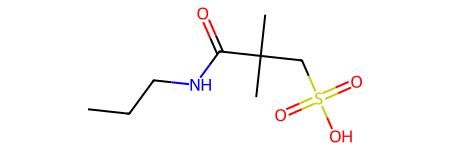

In [73]:
mol_n1 

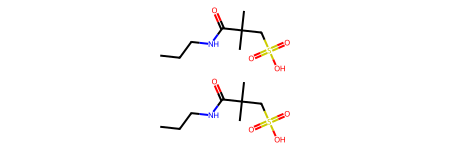

In [74]:
mol_n2

In [76]:
from rdkit import Chem
from rdkit.Chem import Draw

# Define SMILES for n = 1, 2, 3 repeat units
smi_n1 = 'C(C)(C(CS(=O)(=O)O))NC(=O)C'
smi_n2 = 'C(C)(C(CS(=O)(=O)O))NC(=O)C[C@H](C(C)(C(CS(=O)(=O)O))NC(=O)C)H'
smi_n3 = 'C(C)(C(CS(=O)(=O)O))NC(=O)C[C@H](C)C(C)(C(CS(=O)(=O)O))NC(=O)C'


# Convert SMILES to molecules
mol_n1 = Chem.MolFromSmiles(smi_n1)
mol_n2 = Chem.MolFromSmiles(smi_n2)
mol_n3 = Chem.MolFromSmiles(smi_n3)

[09:19:28] SMILES Parse Error: syntax error while parsing: C(C)(C(CS(=O)(=O)O))NC(=O)C[C@H](C(C)(C(CS(=O)(=O)O))NC(=O)C)H
[09:19:28] SMILES Parse Error: check for mistakes around position 62:
[09:19:28] S(=O)(=O)O))NC(=O)C)H
[09:19:28] ~~~~~~~~~~~~~~~~~~~~^
[09:19:28] SMILES Parse Error: Failed parsing SMILES 'C(C)(C(CS(=O)(=O)O))NC(=O)C[C@H](C(C)(C(CS(=O)(=O)O))NC(=O)C)H' for input: 'C(C)(C(CS(=O)(=O)O))NC(=O)C[C@H](C(C)(C(CS(=O)(=O)O))NC(=O)C)H'


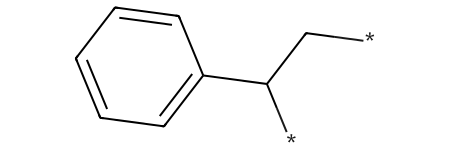

In [77]:
from rdkit import Chem
from rdkit.Chem import Draw

# Define SMILES for n = 1, 2, 3 repeat units
smi_n1 = '[*]CC([*])c1ccccc1'



# Convert SMILES to molecules
mol_n1 = Chem.MolFromSmiles(smi_n1)
mol_n1

In [89]:
from rdkit import Chem
from rdkit.Chem import Draw

# Define SMILES for n = 1, 2, 3 repeat units of Poly(acrylamide)
smi_n1 ='C=CC(=O)N'
smi_n3 = 'C(C(=O)N)CC(C(=O)N)CC(C(=O)N)C'
smi_n10 = 'C(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)C'



# Convert SMILES to molecules
mol_n1 = Chem.MolFromSmiles(smi_n1)
mol_n3 = Chem.MolFromSmiles(smi_n3)
mol_n10 = Chem.MolFromSmiles(smi_n10)

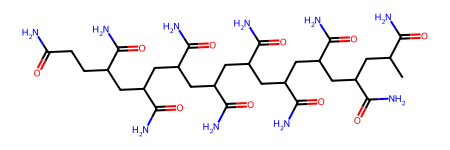

In [90]:
mol_n10


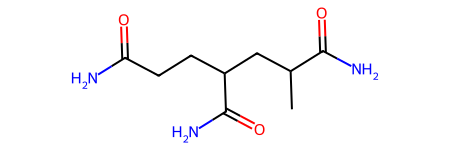

In [91]:
mol_n3

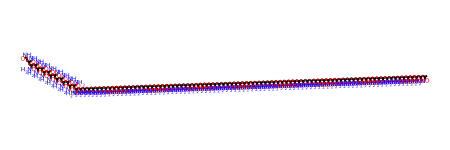

In [87]:
smi_n100 = 'C(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)C'



# Convert SMILES to molecules
mol_n100 = Chem.MolFromSmiles(smi_n100)
mol_n100


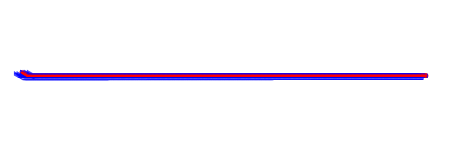

In [88]:
smi_n1000 = 'C(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)CC(C(=O)N)C'



# Convert SMILES to molecules
mol_n1000 = Chem.MolFromSmiles(smi_n1000)
mol_n1000

In [92]:
train_smiles_list = [smi_n1, smi_n3, smi_n10, smi_n100, smi_n1000]
    
model_SMI = load_smi_ted(folder='../models/smi_ted/smi_ted_light', ckpt_filename='smi-ted-Light_40.pt')

return_tensor=True
with torch.no_grad():
    x_emb = model_SMI.encode(train_smiles_list, return_torch=return_tensor)

x_emb_array  = x_emb.numpy()
x_emb_frame = pd.DataFrame(x_emb_array)

Random Seed: 12345
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Vocab size: 2393
[INFERENCE MODE - smi-ted-Light]


/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/numpy/core/fromnumeric.py:59: FutureWarning:

'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.

100%|██████████| 5/5 [00:00<00:00, 19.70it/s]


In [93]:
x_emb_frame

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.266046,-0.483814,0.044580,0.464018,0.271833,-0.710817,1.214043,-0.030746,0.872578,0.246347,...,-1.284910,-0.188731,0.238101,0.172761,-0.664860,0.466174,-0.494634,1.037645,0.607236,-0.144624
1,0.383560,-0.437423,0.046721,0.426101,0.547638,-0.747131,1.122984,0.053043,0.830383,0.177022,...,-1.425922,-0.115476,0.185710,0.331409,-0.655761,0.563046,-0.651279,0.908061,0.656757,-0.090570
2,0.304948,-0.356207,0.082831,0.365675,0.522060,-0.791396,0.879056,0.007908,0.763482,0.064876,...,-1.324200,0.030782,0.066098,0.206454,-0.672572,0.572678,-0.698609,0.877547,0.644948,-0.192133
3,0.270148,1.015020,0.092516,0.646347,0.464862,0.090497,0.209219,-0.295458,0.335327,-0.607088,...,-0.404627,0.249427,-0.336233,1.904569,0.711132,0.648722,-1.382721,1.459746,0.748875,-0.591495
4,0.270148,1.015020,0.092516,0.646347,0.464862,0.090497,0.209219,-0.295458,0.335327,-0.607088,...,-0.404627,0.249427,-0.336233,1.904569,0.711132,0.648722,-1.382721,1.459746,0.748875,-0.591495


In [94]:
labels = ['1-mer', '3-mer', '10-mer', '100-mer', '1000-mer']

# Add a new column named 'mer_length'
x_emb_frame['mer_length'] = labels

In [95]:
x_emb_frame

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,mer_length
0,0.266046,-0.483814,0.044580,0.464018,0.271833,-0.710817,1.214043,-0.030746,0.872578,0.246347,...,-0.188731,0.238101,0.172761,-0.664860,0.466174,-0.494634,1.037645,0.607236,-0.144624,1-mer
1,0.383560,-0.437423,0.046721,0.426101,0.547638,-0.747131,1.122984,0.053043,0.830383,0.177022,...,-0.115476,0.185710,0.331409,-0.655761,0.563046,-0.651279,0.908061,0.656757,-0.090570,3-mer
2,0.304948,-0.356207,0.082831,0.365675,0.522060,-0.791396,0.879056,0.007908,0.763482,0.064876,...,0.030782,0.066098,0.206454,-0.672572,0.572678,-0.698609,0.877547,0.644948,-0.192133,10-mer
3,0.270148,1.015020,0.092516,0.646347,0.464862,0.090497,0.209219,-0.295458,0.335327,-0.607088,...,0.249427,-0.336233,1.904569,0.711132,0.648722,-1.382721,1.459746,0.748875,-0.591495,100-mer
4,0.270148,1.015020,0.092516,0.646347,0.464862,0.090497,0.209219,-0.295458,0.335327,-0.607088,...,0.249427,-0.336233,1.904569,0.711132,0.648722,-1.382721,1.459746,0.748875,-0.591495,1000-mer


In [110]:
# Compare row at index 0 with row at index 2
row1 = x_emb_frame.iloc[-1,0:-1]
row2 = x_emb_frame.iloc[-2,0:-1]
are_equal = row1.equals(row2)
print(f"Row at index 0 and row at index 2 are equal: {are_equal}")

Row at index 0 and row at index 2 are equal: True


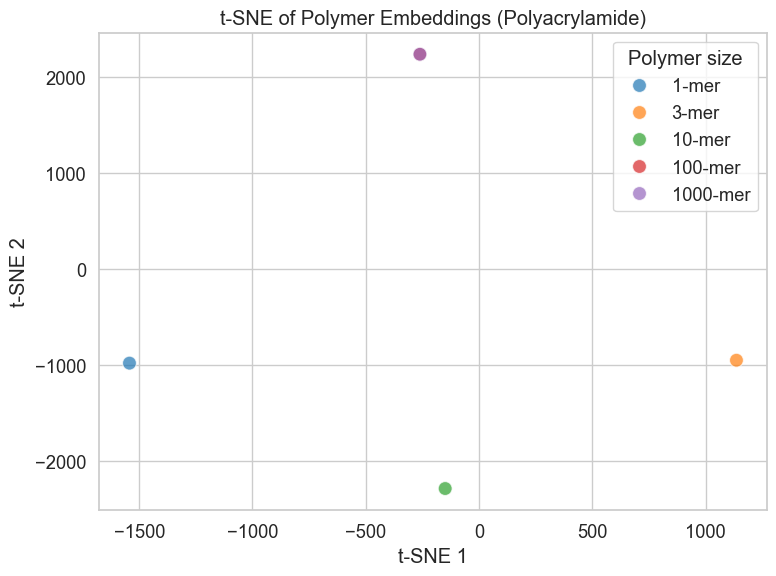

In [105]:
# Separate features and labels
X = x_emb_frame.drop(columns=['mer_length']).values
labels = x_emb_frame['mer_length'].values

# Run t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=2)  # Small dataset → small perplexity
X_tsne = tsne.fit_transform(X)

# Plot
plt.figure(figsize=(8, 6))
sns.set(style='whitegrid', font_scale=1.2)

# Scatter plot colored by labels
palette = sns.color_palette("tab10", n_colors=len(set(labels)))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=labels, palette=palette, s=100, alpha =0.7)

plt.title('t-SNE of Polymer Embeddings (Polyacrylamide)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.tight_layout()
plt.legend(title='Polymer size')
plt.show()


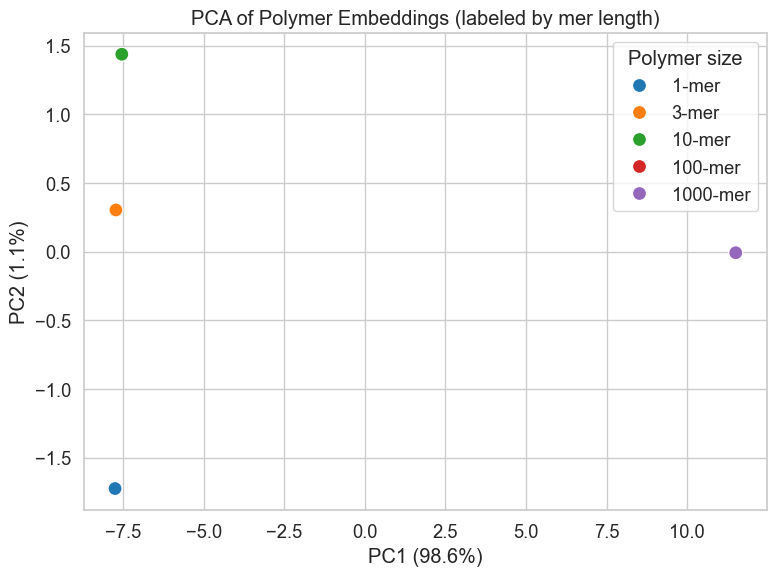

In [106]:


# Separate features and labels
X = x_emb_frame.drop(columns=['mer_length']).values
labels = x_emb_frame['mer_length'].values

# Run PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Plot
plt.figure(figsize=(8, 6))
sns.set(style='whitegrid', font_scale=1.2)

palette = sns.color_palette("tab10", n_colors=len(set(labels)))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=labels, palette=palette, s=100)

plt.title('PCA of Polymer Embeddings (labeled by mer length)')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
plt.legend(title='Polymer size')
plt.tight_layout()
plt.show()


/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



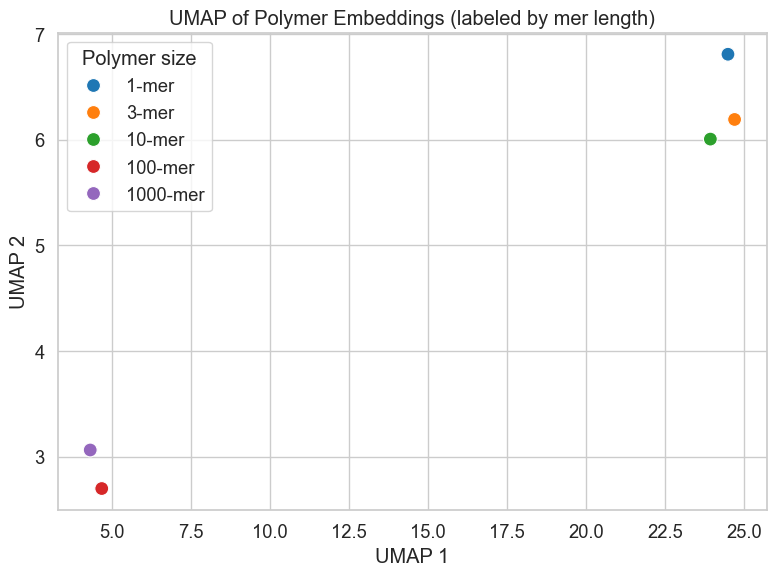

In [107]:

# Run UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=2, min_dist=0.1)  # Small data → small n_neighbors
X_umap = umap_reducer.fit_transform(X)

# Plot
plt.figure(figsize=(8, 6))
sns.set(style='whitegrid', font_scale=1.2)

sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=labels, palette=palette, s=100)

plt.title('UMAP of Polymer Embeddings (labeled by mer length)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(title='Polymer size')
plt.tight_layout()
plt.show()

In [ ]:
# adds randomness + graph-based approximations 

In [113]:
# check the vector relationship between latent space of multiple mers?

In [115]:
x_emb_frame.to_csv('x_emb_frame_Polyacrylamide.csv', index=False)

In [114]:
x_emb_frame

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,mer_length
0,0.266046,-0.483814,0.044580,0.464018,0.271833,-0.710817,1.214043,-0.030746,0.872578,0.246347,...,-0.188731,0.238101,0.172761,-0.664860,0.466174,-0.494634,1.037645,0.607236,-0.144624,1-mer
1,0.383560,-0.437423,0.046721,0.426101,0.547638,-0.747131,1.122984,0.053043,0.830383,0.177022,...,-0.115476,0.185710,0.331409,-0.655761,0.563046,-0.651279,0.908061,0.656757,-0.090570,3-mer
2,0.304948,-0.356207,0.082831,0.365675,0.522060,-0.791396,0.879056,0.007908,0.763482,0.064876,...,0.030782,0.066098,0.206454,-0.672572,0.572678,-0.698609,0.877547,0.644948,-0.192133,10-mer
3,0.270148,1.015020,0.092516,0.646347,0.464862,0.090497,0.209219,-0.295458,0.335327,-0.607088,...,0.249427,-0.336233,1.904569,0.711132,0.648722,-1.382721,1.459746,0.748875,-0.591495,100-mer
4,0.270148,1.015020,0.092516,0.646347,0.464862,0.090497,0.209219,-0.295458,0.335327,-0.607088,...,0.249427,-0.336233,1.904569,0.711132,0.648722,-1.382721,1.459746,0.748875,-0.591495,1000-mer


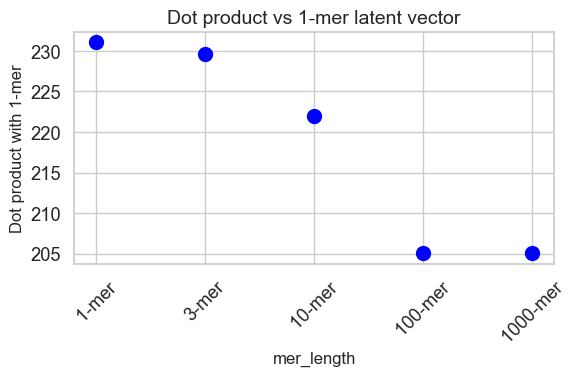

In [116]:
# Extract embeddings (all columns except last one)
embedding_columns = x_emb_frame.columns[:-1]
X = x_emb_frame[embedding_columns].values
labels = x_emb_frame['mer_length'].values

# Compute dot products of row 0 (1-mer) with all other rows
reference_vector = X[0]
dot_products = np.dot(X, reference_vector)

# Plot
plt.figure(figsize=(6, 4))
plt.scatter(labels, dot_products, color='blue', s=100)
plt.title('Dot product vs 1-mer latent vector', fontsize=14)
plt.xlabel('mer_length', fontsize=12)
plt.ylabel('Dot product with 1-mer', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

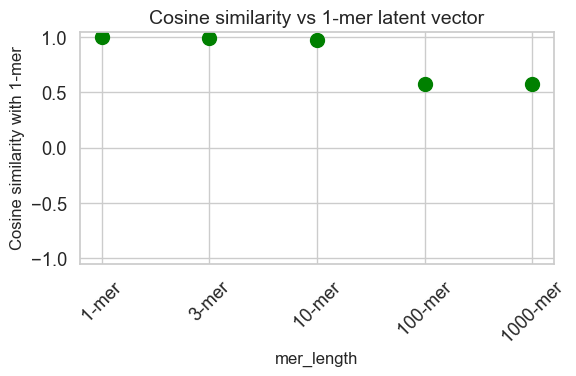

In [117]:
from sklearn.preprocessing import normalize

# Normalize rows to unit length
X_norm = normalize(X, axis=1)

# Compute cosine similarities (dot product of normalized vectors)
cosine_similarities = np.dot(X_norm, X_norm[0])  # similarity to 1-mer

# Plot
plt.figure(figsize=(6, 4))
plt.scatter(labels, cosine_similarities, color='green', s=100)
plt.title('Cosine similarity vs 1-mer latent vector', fontsize=14)
plt.xlabel('mer_length', fontsize=12)
plt.ylabel('Cosine similarity with 1-mer', fontsize=12)
plt.ylim(-1.05, 1.05)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


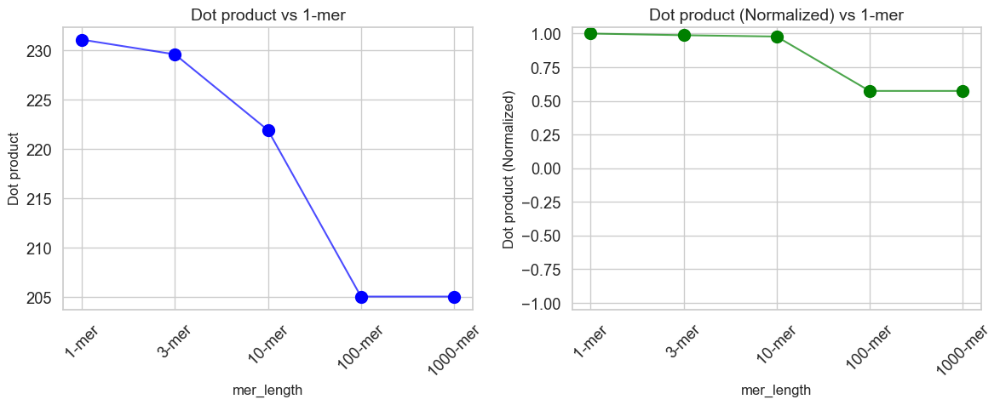

In [119]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize

# Example: Load your dataframe
X = x_emb_frame.iloc[:, :-1].values   # latent space vectors (drop 'mer_length')
labels = x_emb_frame['mer_length'].values  # mer labels

# Normalize vectors (L2 norm, row-wise)
X_norm = normalize(X, axis=1)  # L2 norm (default)

# Compute raw dot products with 1-mer
dot_products = np.dot(X, X[0])  # dot of all vectors with 1-mer

# Compute cosine similarities (dot of normalized vectors)
cosine_similarities = np.dot(X_norm, X_norm[0])

# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot 1: Raw dot product
axes[0].scatter(labels, dot_products, color='blue', s=100, label='Dot product')
axes[0].plot(labels, dot_products, color='blue', linestyle='-', alpha=0.7)
axes[0].set_title('Dot product vs 1-mer', fontsize=14)
axes[0].set_xlabel('mer_length', fontsize=12)
axes[0].set_ylabel('Dot product', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True)

# Plot 2: Cosine similarity
axes[1].scatter(labels, cosine_similarities, color='green', s=100, label='Dot product (Normalized)')
axes[1].plot(labels, cosine_similarities, color='green', linestyle='-', alpha=0.7)
axes[1].set_title('Dot product (Normalized) vs 1-mer', fontsize=14)
axes[1].set_xlabel('mer_length', fontsize=12)
axes[1].set_ylabel('Dot product (Normalized)', fontsize=12)
axes[1].set_ylim(-1.05, 1.05)
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True)

plt.tight_layout()
plt.show()
